In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle
import pywt # for deniosing time-series wavelet

pd.set_option('display.max_columns', 50)
plt.style.use('bmh')
color_pal=plt.rcParams['axes.prop_cycle'].by_key()['color']
color_cycle=cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

In [2]:
# Read the data
INPUT_DIR='m5-forecasting-accuracy/'
cal_data=pd.read_csv(INPUT_DIR+'calendar.csv')
salestv_data=pd.read_csv(INPUT_DIR+'sales_train_validation.csv')
ss_data=pd.read_csv(INPUT_DIR+'sample_submission.csv')
sellp_data=pd.read_csv(INPUT_DIR+'sell_prices.csv')

In [3]:
ss_data.head()

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15,F16,F17,F18,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
salestv_data.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,...,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,4,2,3,0,1,2,0,0,0,1,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0,0,0,0,1,2,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,3,1,2,1,3,1,0,2,5,4,2,0,3,0,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,4,0,1,4,0,1,0,1,0,1,1,2,0,1,1,2,1,1,0,1,1,2,2,2,4


In [5]:
cal_data.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [6]:
sellp_data.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


# Visualizing the data for a single item that sells frequently

In [14]:
def list_to_df(list_obj):
    return pd.Series(list_obj)

Simply plotting the sales for a specific item to understand the trend

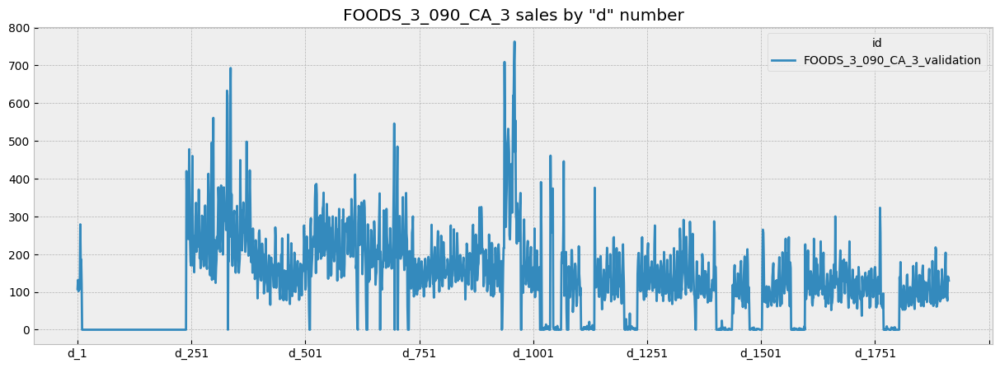

In [9]:
d_cols=[c for c in salestv_data.columns if 'd_' in c]

# Below we are the chaining the following operations
# 1. Select a particular item
# 2. Set id as index, & keep only sales data column starting with d_
# 3. Transform so that dataframe is a column
# 4. Plot the data
salestv_data.loc[salestv_data['id']=='FOODS_3_090_CA_3_validation'] \
.set_index('id')[d_cols] \
.T \
.plot(figsize=(15,5), title='FOODS_3_090_CA_3 sales by "d" number',color=next(color_cycle))
plt.show()

Plotting a random sample sales data by merging with calendar data to plot exact dates on x-axis 

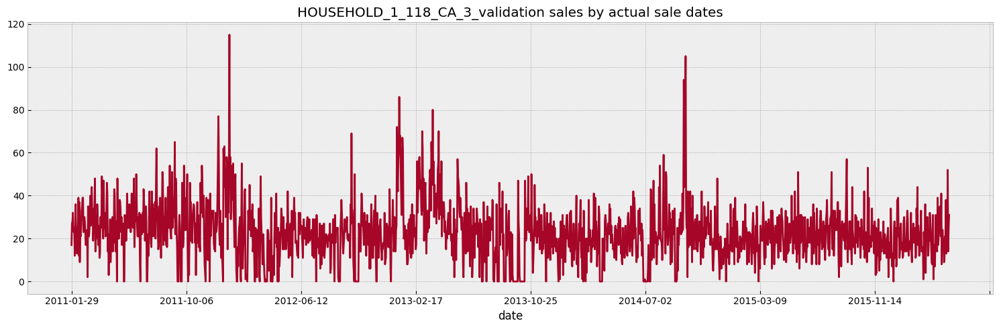

In [10]:
ids = ['FOODS_3_090_CA_3_validation', 'HOBBIES_1_234_CA_3_validation', 'HOUSEHOLD_1_118_CA_3_validation', 'HOBBIES_1_001_CA_1_validation']
examples = []

# General function to extract specific item Id values from sales_train_evaluation dataset
for i in range(len(ids)):
    # Merge calendar date with sales_train_evaluation date
    examples.append(salestv_data.loc[salestv_data['id']== ids[i]][d_cols].T) # Fetch a specific Id and transform it as column
    examples[i] = examples[i].rename(columns={examples[i].columns.values[0] : ids[i]}) # Rename column e.g 8412 (location Id) to the proper name
    examples[i] = examples[i].reset_index().rename(columns={'index':'d'}) # Reset index so, d_cols are not index and then, rename index as d
    examples[i] = examples[i].merge(cal_data) # Merge two dataframe on the bases of column named d


graph_ids = [2]
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    # Set date as the index of dataframe to be plotted properly and only fetch specific Id sales value
    examples[graph_id].set_index('date')[ids[graph_id]] \
    .plot(figsize=(15,5), color=next(color_cycle), title= f'{ids[graph_id]} sales by actual sale dates', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    ax_id+=1
plt.tight_layout()
plt.show()

Plotting the sample sale snippet, kind of zooming

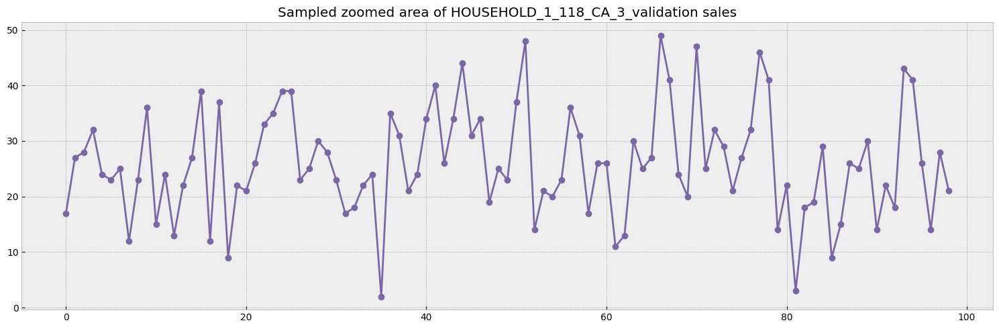

In [11]:
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][:99][ids[graph_id]].plot(figsize=(15,5),color=next(color_cycle), marker='o',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    ax_id+=1
plt.tight_layout()
plt.show()

### Deniosing sales to know underlying trends  

Wavelet denoising - calculate wavelet coefficeints and discard low coefficients 

In [12]:
# Return Mean absolute deviation value
def maddest(d, axis=None):
    return np.mean(np.absolute(d-np.mean(d,axis)), axis)

# Denoise the signal
def denoise(x, wavelet='db4',level=1):
    coeff = pywt.wavedec(x,wavelet,mode='per')
    sigma=(1/0.6745)*maddest(coeff[-level])
    
    uthresh=sigma*np.sqrt(2*np.log(len(x)))
    coeff[1:]=(pywt.threshold(i,value=uthresh,mode='hard') for i in coeff[1:])
    return pywt.waverec(coeff,wavelet,mode='per')

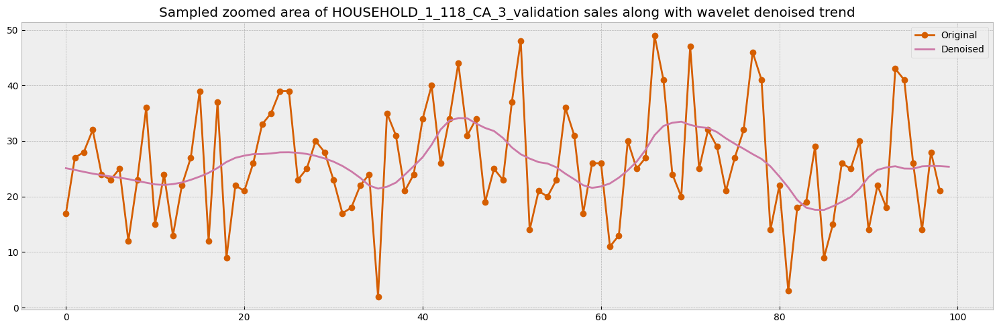

In [15]:
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', label='Original',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales along with wavelet denoised trend', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    list_to_df(denoise(examples[graph_id][ids[graph_id]][:99])).plot(figsize=(15,5),color=next(color_cycle), label='Denoised',
                                                ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    axs[ax_id].legend() if len(graph_ids)!=1 else axs.legend()
    ax_id+=1
    
plt.tight_layout()
plt.show()

Plotting original sales and denoised sales side-by-side for better understanding the trend

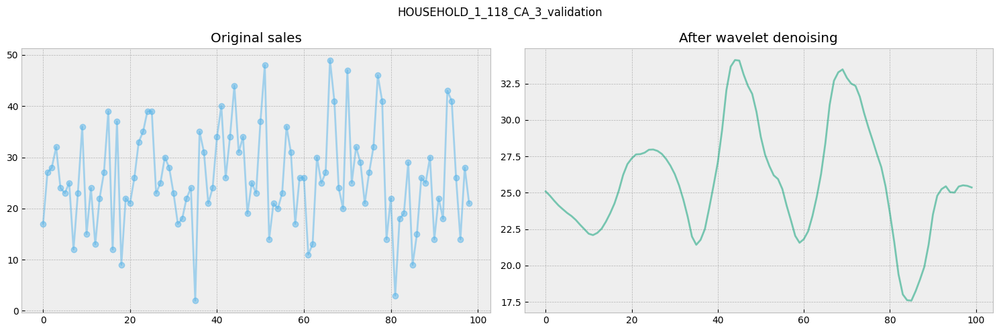

In [16]:
fig, axs = plt.subplots(len(graph_ids),2,figsize=(30,10)) 
axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', alpha=0.5,
                                                title='Original sales', ax=axs[ax_id])
    ax_id+=1
    list_to_df(denoise(examples[graph_id][ids[graph_id]][:99])).plot(figsize=(15,5),color=next(color_cycle), alpha=0.5,
                                                                     title='After wavelet denoising', ax=axs[ax_id])
    ax_id+=1
    plt.suptitle(f'{ids[graph_id]}')
plt.tight_layout()
plt.show()

Average smoothing or rolling mean denoising - A method that uses window & stride concept to denoise the data by taking mean of windowed elements and moving the window by stride 

In [17]:
def average_smoothing(x, window=3, stride=1):
    new_x = []
    start = 0
    end = window
    while end<=len(x):
        new_x.extend(np.ones(end-start)*np.mean(x[start:end]))
        start = start + stride
        end = end + stride
    return np.array(new_x)

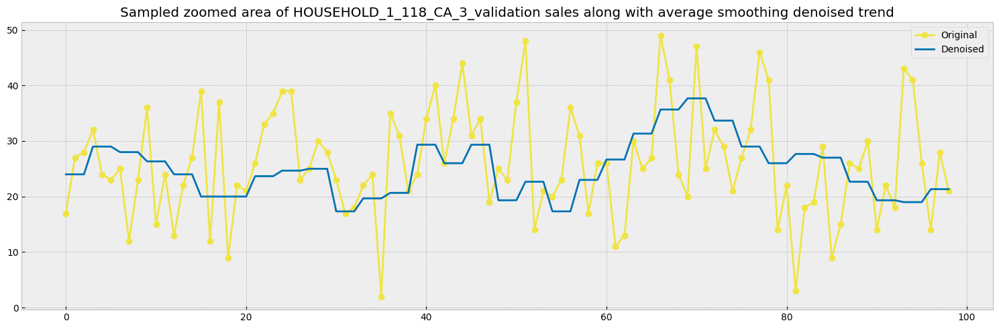

In [18]:
fig, axs = plt.subplots(len(graph_ids),1,figsize=(15,10)) 
if len(graph_ids) != 1 : axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', label='Original',
                                                title=f'Sampled zoomed area of {ids[graph_id]} sales along with average smoothing denoised trend', ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    list_to_df(average_smoothing(examples[graph_id][ids[graph_id]])[:99]).plot(figsize=(15,5),color=next(color_cycle), label='Denoised',
                                                ax=axs[ax_id] if len(graph_ids)!=1 else axs)
    axs[ax_id].legend() if len(graph_ids)!=1 else axs.legend()
    ax_id+=1
    
plt.tight_layout()
plt.show()

Plotting original sales and denoised sales side-by-side for better understanding the trend

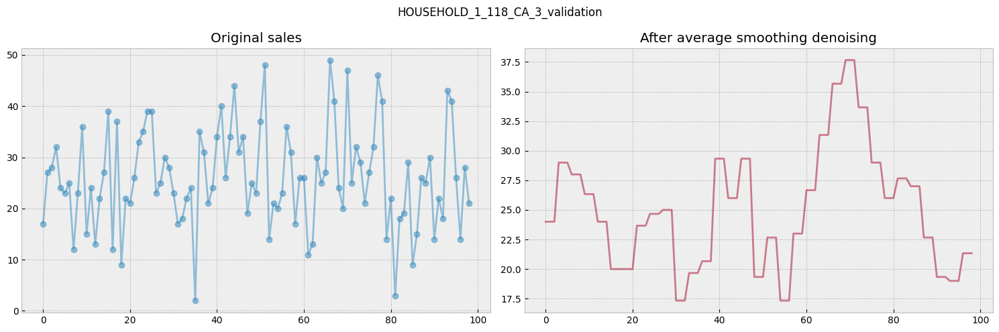

In [19]:
fig, axs = plt.subplots(len(graph_ids),2,figsize=(30,10)) 
axs=axs.flatten() 

ax_id=0
for graph_id in graph_ids:
    examples[graph_id][ids[graph_id]][:99].plot(figsize=(15,5),color=next(color_cycle), marker='o', alpha=0.5,
                                                title='Original sales', ax=axs[ax_id])
    ax_id+=1
    list_to_df(average_smoothing(examples[graph_id][ids[graph_id]])[:99]).plot(figsize=(15,5),color=next(color_cycle), alpha=0.5,
                                                                     title='After average smoothing denoising', ax=axs[ax_id])
    ax_id+=1
    plt.suptitle(f'{ids[graph_id]}')
plt.tight_layout()
plt.show()

### Sales broken down by day of the week, month & year

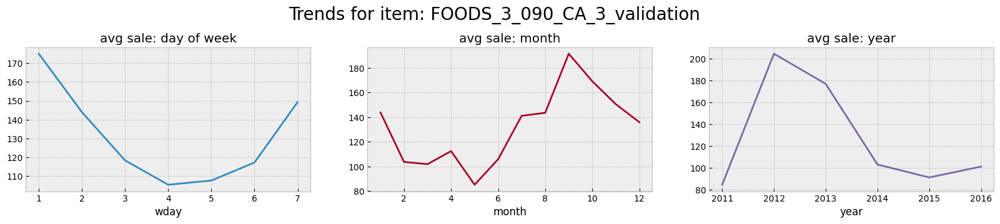

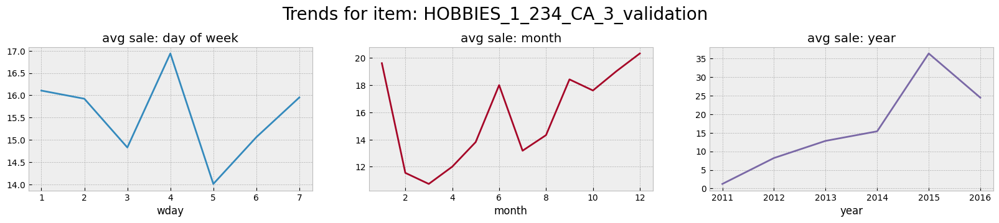

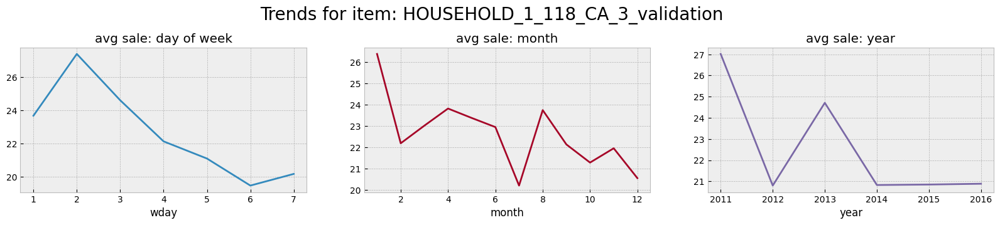

In [20]:
for i in [0, 1, 2]:
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(20,3))
    # Groupby wday colum and do mean or count etc. to values of other columns & then, extract the specific sales Id column  
    examples[i].groupby('wday')[ids[i]].mean()\
    .plot(kind='line', title='avg sale: day of week', color=color_pal[0], ax=ax1)
    
    examples[i].groupby('month')[ids[i]].mean() \
    .plot(kind='line', title='avg sale: month', color=color_pal[1], ax=ax2)
    
    examples[i].groupby('year')[ids[i]].mean()\
    .plot(kind='line', title='avg sale: year', color=color_pal[2], ax=ax3)
    
    fig.suptitle(f'Trends for item: {ids[i]}', size=20, y=1.1)

### Visualizing random 20 different items with their sales to analyze some trends

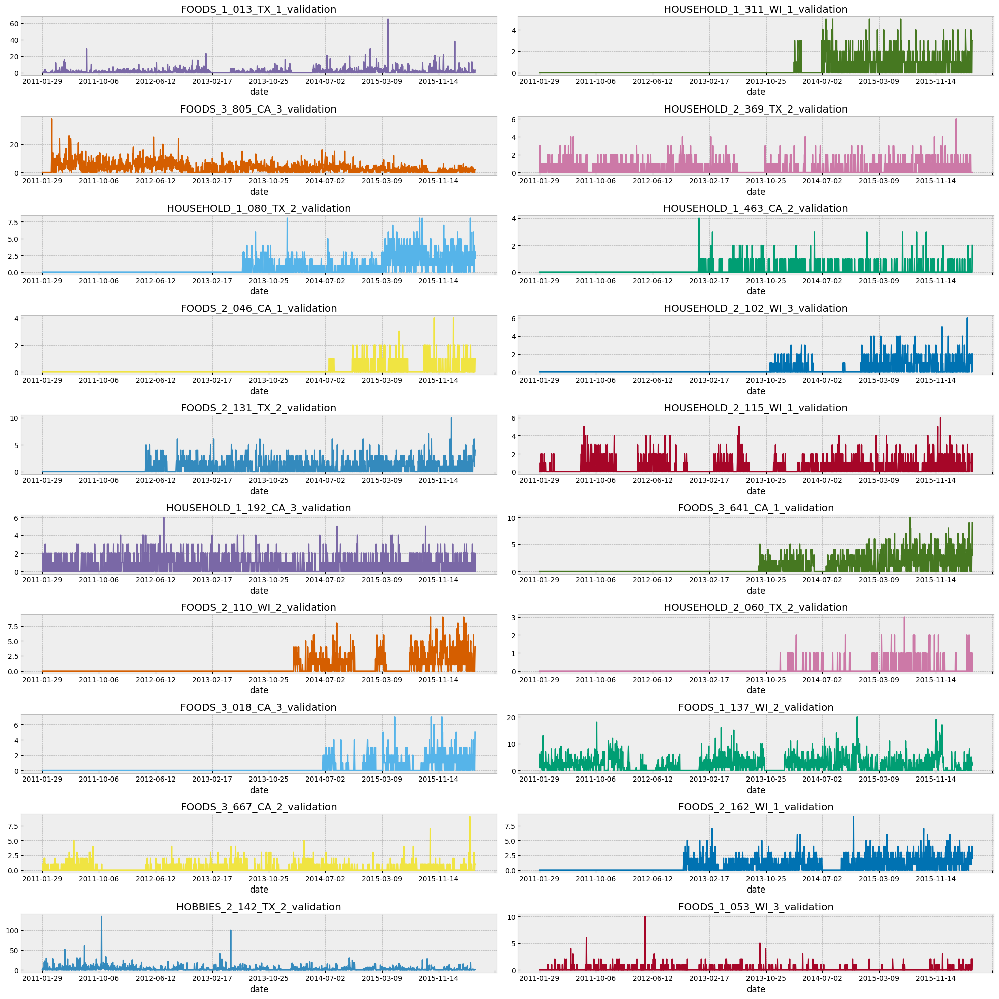

In [21]:
twenty_examples = salestv_data.sample(20, random_state=529) # Sample random 20 samples from the salestv dataframe
list_of_sampled_id = list(twenty_examples['id']) # Extract the list of sampled id of items so as to just keep these id values in the dataframe eventually
twenty_examples = twenty_examples.set_index('id')[d_cols].T # Set the index of dataframe to be id column, select only the d columns & transform the 
twenty_examples = twenty_examples.reset_index().rename(columns={'index':'d'})
twenty_examples = twenty_examples.merge(cal_data)
twenty_examples = twenty_examples.set_index('date')[list_of_sampled_id] 


fig, axs = plt.subplots(10,2,figsize=(20,20))
axs = axs.flatten()

axs_id=0
for item in twenty_examples.columns:
    twenty_examples[item].plot(title=item, color=next(color_cycle), ax=axs[axs_id])
    axs_id+=1
plt.tight_layout()
plt.show()

### Sales over time by category type

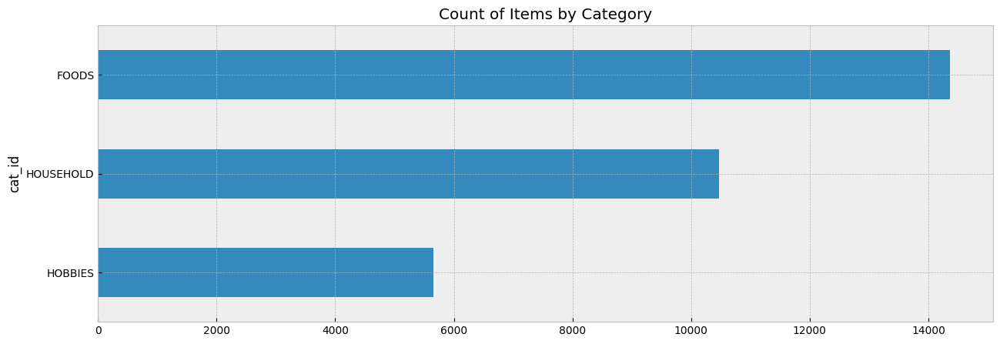

In [22]:
# Plot of count of Items by category
salestv_data.groupby('cat_id').count()['id'].sort_values().plot(kind='barh', title='Count of Items by Category', figsize=(15,5))
plt.show()

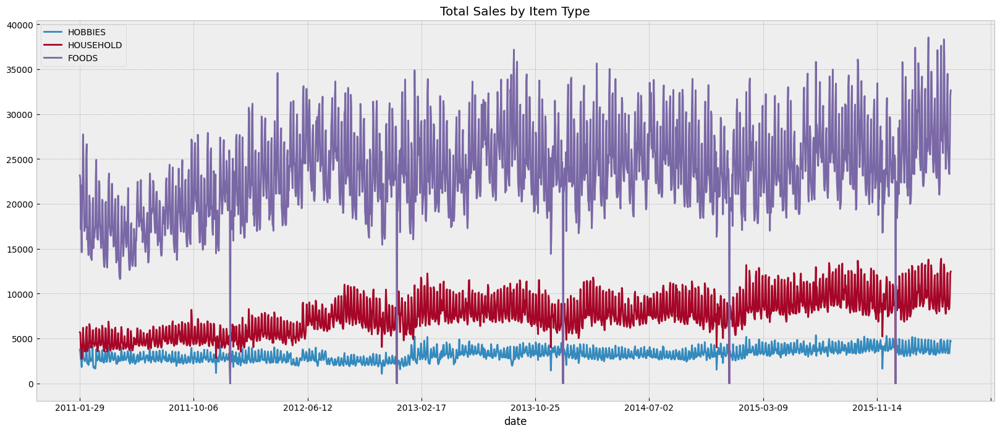

In [23]:
past_sales_item = salestv_data.set_index('id')[d_cols].T \
.merge(cal_data.set_index('d')['date'], left_index=True, right_index=True).set_index('date')

#print(past_sales)
for i in salestv_data['cat_id'].unique():
    items_col = [c for c in past_sales_item.columns if i in c]
    past_sales_item[items_col].sum(axis=1).plot(figsize=(20,8), title='Total Sales by Item Type')

plt.legend(salestv_data['cat_id'].unique())
plt.show()

### Sales by store category

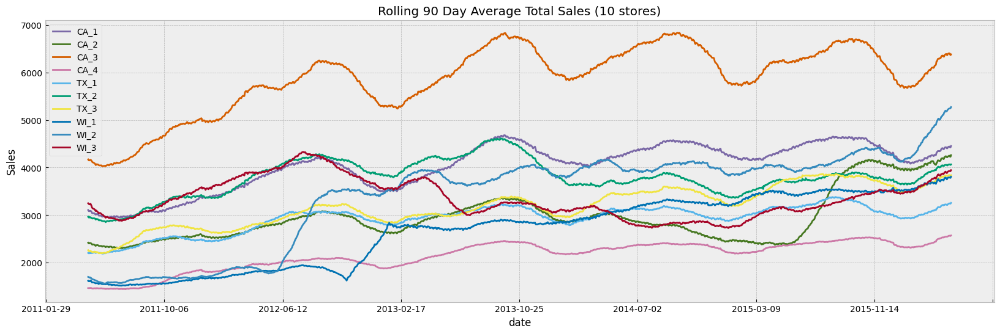

In [24]:
store_list = sellp_data['store_id'].unique()
for i in store_list:
    # Rolling 90 day average of sales 
    store_items = [c for c in past_sales_item.columns if i in c]
    past_sales_item[store_items].sum(axis=1).rolling(90).mean() \
    .plot(kind='line', figsize=(20,6), color=next(color_cycle), title='Rolling 90 Day Average Total Sales (10 stores)')

plt.ylabel('Sales')
plt.legend(store_list)
plt.show()

Rolling 90 day whisker plot for average sales and store - by matplolib

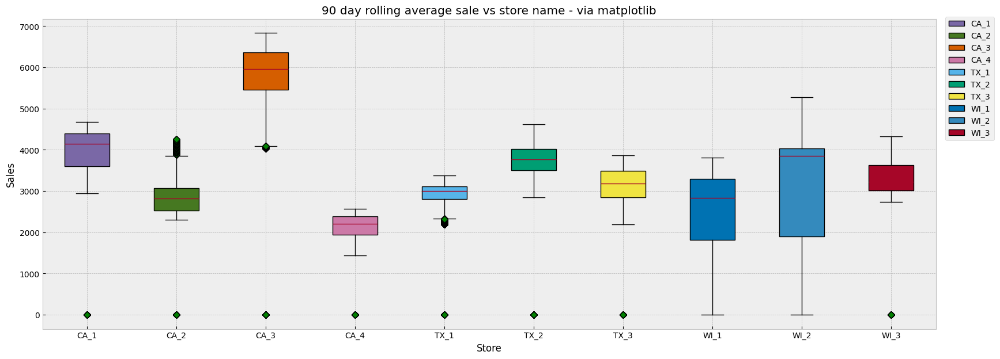

In [25]:
all_data = []

for s in store_list:
    store_items = [c for c in past_sales_item.columns if s in c]
    data = past_sales_item[store_items].sum(axis=1).rolling(90).mean()
    all_data.append(np.nan_to_num(np.array(data)))


plt.figure(figsize=(20,7)) 
green_diamond = dict(markerfacecolor='g', marker='D')
bplot = plt.boxplot(all_data, labels=store_list, flierprops=green_diamond, patch_artist=True, manage_ticks=True)

# fill boxplots with colors
colors = [next(color_cycle) for i in range(0,len(store_list))]
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)   

plt.xlabel('Store')
plt.ylabel('Sales')
plt.title('90 day rolling average sale vs store name - via matplotlib')
plt.legend(bplot['boxes'],store_list, bbox_to_anchor=(1.07,1.02))
plt.show()

Rolling 90 day whisker plot for average sales and store - by plotly

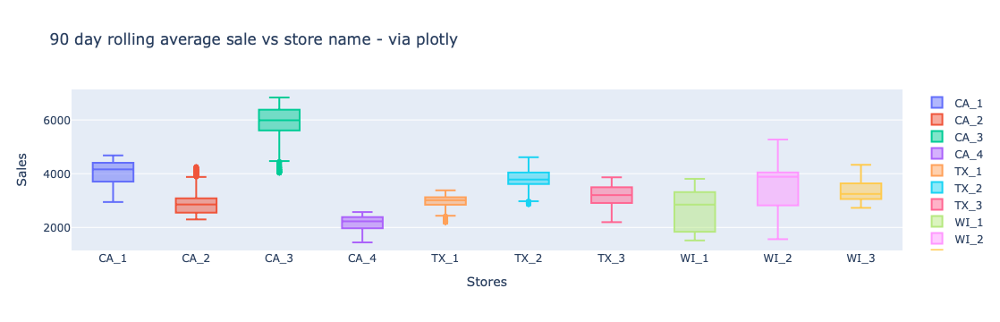

In [26]:
import plotly.graph_objects as go
fig=go.Figure()
for i, s in enumerate(store_list):
    store_items = [c for c in past_sales_item.columns if s in c]
    data = past_sales_item[store_items].sum(axis=1).rolling(90).mean()
    fig.add_trace(go.Box(x=[s]*len(data), y=data, name=s))
fig.update_layout(yaxis_title="Sales", xaxis_title="Stores", title="90 day rolling average sale vs store name - via plotly")

Mean sales of store 

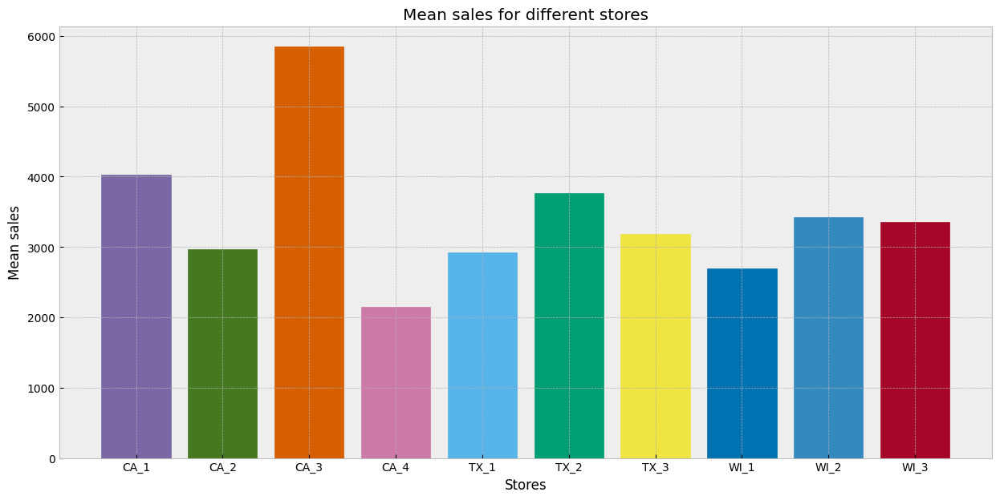

In [27]:
mean_value_store = []
for s in store_list:
    store_items = [c for c in past_sales_item if s in c]
    mean_value_store.append(np.mean(past_sales_item[store_items].sum(axis=1)))

plt.figure(figsize=(15,7))
bplot = plt.bar(store_list,mean_value_store)

#fill different colors for bar plot
colors = [next(color_cycle) for i in range(0,len(store_list))]
for i, b in enumerate(bplot):
    b.set_color(colors[i])
    
plt.xlabel('Stores')
plt.ylabel('Mean sales')
plt.title('Mean sales for different stores')
plt.show()

# Rolling 7 day demand count by store 

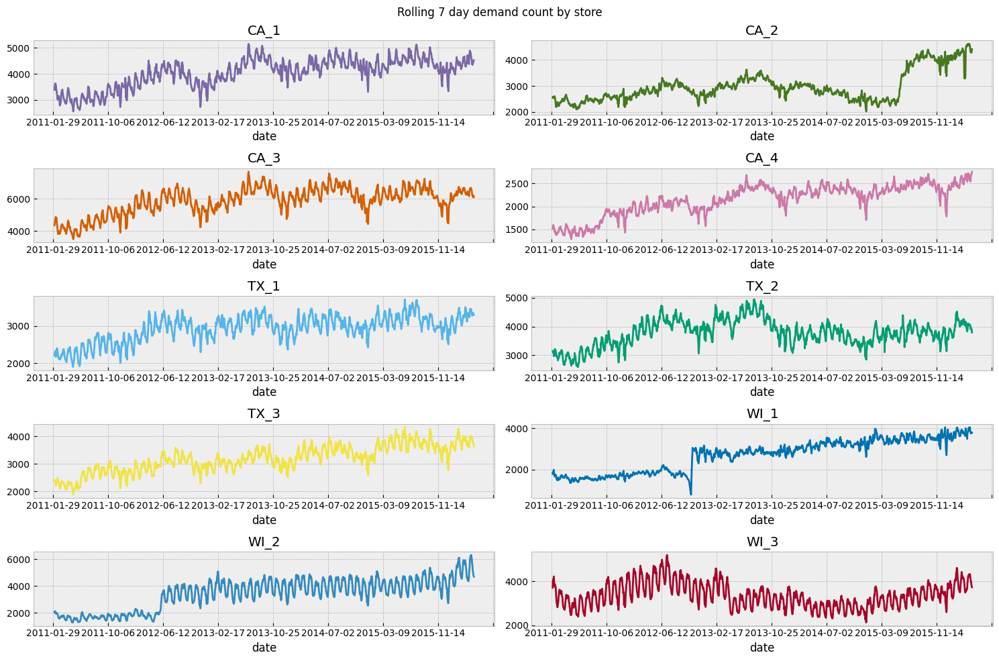

In [28]:
fig, axs = plt.subplots(5,2,figsize=(15,10))
axs=axs.flatten()
ax_id=0

for i in sellp_data['store_id'].unique():
    store_items = [c for c in past_sales_item.columns if i in c]
    past_sales_item[store_items].sum(axis=1) \
    .rolling(7).mean() \
    .plot(title=i, color=next(color_cycle), ax=axs[ax_id])
    
    ax_id+=1

plt.suptitle('Rolling 7 day demand count by store')
plt.tight_layout()
plt.show()

In [29]:
# build the merged DataFrame first
df_merged_1 = (
    salestv_data
      .groupby('store_id')
      .sum()
      .T
      .merge(cal_data.set_index('d'), left_index=True, right_index=True)
      .set_index('date')
)

# now group by weekday, pick only your store_id columns, then mean
result = (
    df_merged_1.groupby('wday')[sellp_data['store_id'].unique()].mean()
)

# Sale prices EDA

1. Sale price of one of the most selling product over the years along different stores

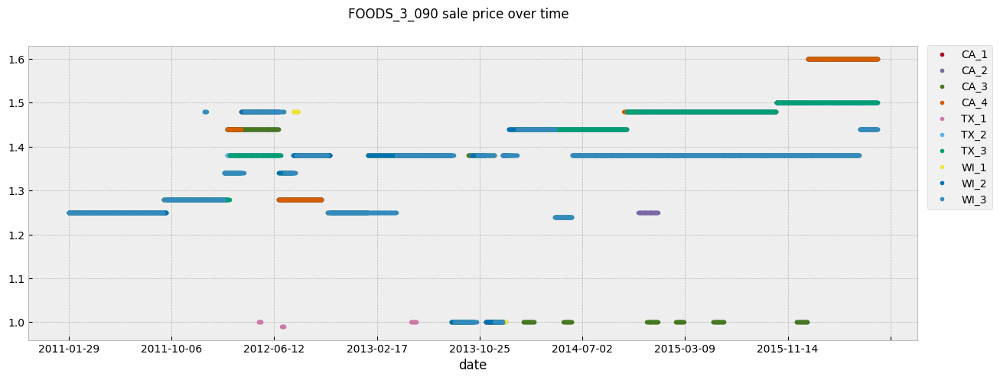

In [62]:
fig, axs = plt.subplots(figsize=(15,5))
stores=[]

for store, d in sellp_data.query('item_id == "FOODS_3_090"').groupby('store_id'):
    # Merge cal_data with wm_yr_wk to plot against actual dates
    merged_d = d.set_index('wm_yr_wk').merge(cal_data.set_index('wm_yr_wk'),left_index=True, right_index=True)
    # Plot the sales over time 
    merged_d.plot(x='date', y='sell_price', color=next(color_cycle), ax=axs, legend=store, style='.')
    stores.append(store)

plt.legend(stores, bbox_to_anchor=(1.09,1.02))
plt.suptitle('FOODS_3_090 sale price over time')
plt.show()

2. Log distribution of sale price for different food categories 

In [63]:
# Add a category column to sellp data 
sellp_data['Category'] = sellp_data['item_id'].apply(lambda x: x.split('_')[0])

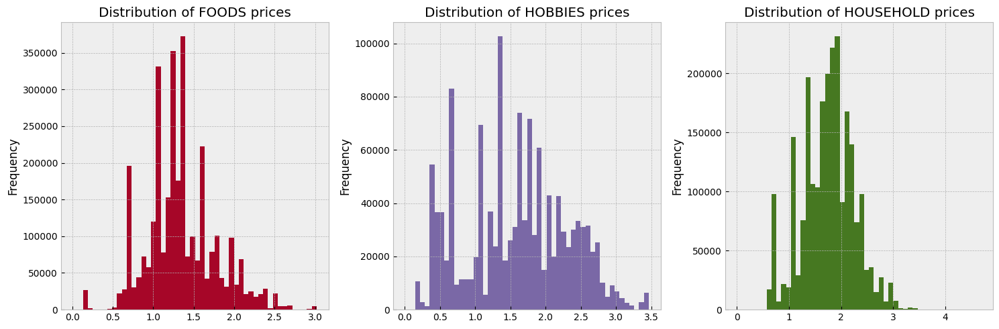

In [64]:
fig, axs = plt.subplots(1,3,figsize=(15,5))
ax_id=0

for cat, d in sellp_data.groupby('Category'):
    # Do the log of values of sell_price columns & plot it's histogram distribution
    d['sell_price'].apply(np.log1p).plot(kind='hist', bins=50,ax=axs[ax_id], color=next(color_cycle), title=f"Distribution of {cat} prices")
    ax_id+=1
        
plt.tight_layout()
plt.show()

# Modeling

In [65]:
train_dataset = salestv_data[d_cols[-100:-30]]
val_dataset = salestv_data[d_cols[-30:]]

print(val_dataset.values)

[[1 1 1 ... 0 1 1]
 [1 1 1 ... 0 0 0]
 [1 0 0 ... 1 1 1]
 ...
 [0 1 1 ... 0 1 0]
 [2 4 3 ... 3 1 3]
 [0 5 7 ... 0 0 0]]


In [66]:
# Utility function to plot graph
def plot_graphs(ids=[0,2], pred=[], pred_value=False):
    fig, axs = plt.subplots(len(ids), 1, figsize=(20,5))
    if len(ids)!=1 : axs = axs.flatten()
    
    if len(ids)==1:
        axs.plot(list(train_dataset.loc[ids[0]].keys()), train_dataset.loc[ids[0]].values)
        axs.plot(list(val_dataset.loc[ids[0]].keys()), val_dataset.loc[ids[0]].values)
        if pred_value and pred.any():
            axs.plot(list(val_dataset.loc[ids[0]].keys()), pred[ids[0]])
        axs.tick_params(axis='x', rotation=90)
    else:
        ax_id=0
        for i in ids:
            axs[ax_id].plot(list(train_dataset.loc[i].keys()), train_dataset.loc[i].values)
            axs[ax_id].plot(list(val_dataset.loc[i].keys()), val_dataset.loc[i].values)
            if pred_value and pred.any():
                axs[ax_id].plot(list(val_dataset.loc[i].keys()), pred[i])
            axs[ax_id].tick_params(axis='x', rotation=90)
            ax_id+=1
    plt.suptitle('Plot of few items with train and validation data respectively')
    plt.tight_layout()
    plt.show()   

    Plot the train & validation data to compare further model predictions 

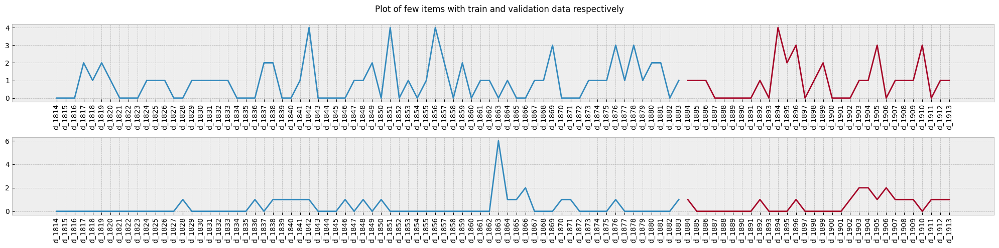

In [67]:
ids = [0, 2]
plot_graphs(ids, [], False)

In [112]:
rmse = []

1. Naive approach - forecast the next day sales as current day sales

In [113]:
def naive_approach():
    predictions=[]
    for i in range(len(val_dataset.columns)):
        if i==0:
            predictions.append(train_dataset[train_dataset.columns[-1]].values)
        else:
            predictions.append(val_dataset[val_dataset.columns[i-1]].values)
    predictions = np.transpose(np.array([list(row) for row in predictions]))
    error_norm = np.linalg.norm(predictions[:3]-val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

Naive Forecast RMSE: 2.6112


Exception ignored in: <function tqdm.__del__ at 0x34fe06ac0>
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/std.py", line 1148, in __del__
    self.close()
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/notebook.py", line 279, in close
    self.disp(bar_style='danger', check_delay=False)
    ^^^^^^^^^
AttributeError: 'tqdm_notebook' object has no attribute 'disp'


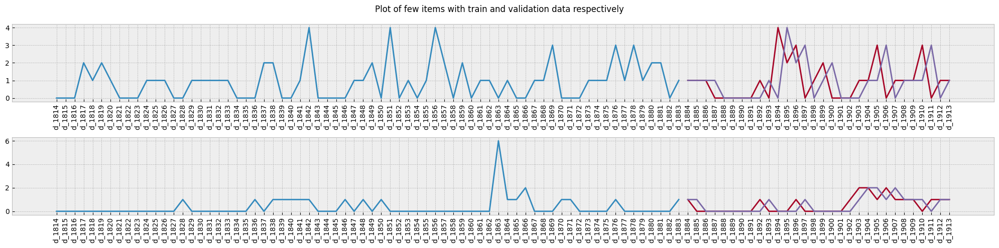

In [115]:
from sklearn.metrics import mean_squared_error

ids=[0, 2]
pred, error_naive=naive_approach()

# Compute RMSE
rmse_naive = np.sqrt(mean_squared_error(val_dataset.values.flatten(), pred.flatten()))
rmse.append(rmse_naive)
print(f"Naive Forecast RMSE: {rmse_naive:.4f}")
plot_graphs(ids, pred, True)

2. Moving average - Take past days (like 30) into consideration to predict the future values 

In [70]:
def moving_average(window=30):
    predictions = []
    for i in range(0, len(val_dataset.columns)):
        if i==0:
            predictions.append(np.mean(train_dataset[train_dataset.columns[-window:]].values, axis=1))
        if i>0 and i<=window:
            predictions.append(np.mean(train_dataset[train_dataset.columns[-window+i:]].values, axis=1) + np.mean(val_dataset[val_dataset.columns[:i]].values, axis=1))
        if i>(window+1):
            predictions.append(np.mean(val_dataset[val_dataset.columns[:i]].values, axis=1))
    predictions=np.transpose(np.array([list(row) for row in predictions]))
    error_norm = np.linalg.norm(predictions[:3]-val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

Moving Average Forecast RMSE: 4.0605


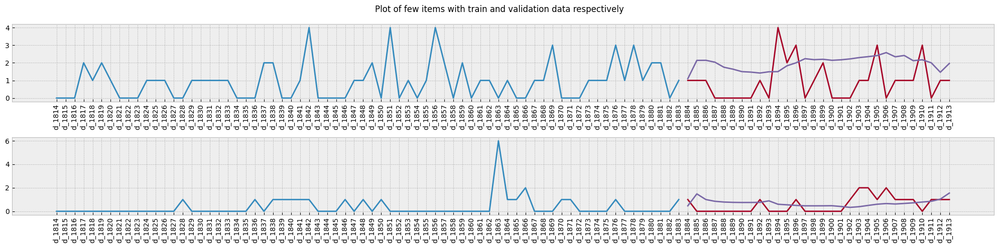

In [116]:
ids=[0, 2]
pred, error_moving = moving_average()
# Compute RMSE
rmse_moving = np.sqrt(mean_squared_error(val_dataset.values.flatten(), pred.flatten()))
rmse.append(rmse_moving)
print(f"Moving Average Forecast RMSE: {rmse_moving:.4f}")
plot_graphs(ids, pred, True)

3. Hot Linear -  Exponential smoothing with trend but no seasonality

In [118]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from tqdm import tqdm

In [119]:
def holt_smoothing():
    predictions = []
    for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
        fit = Holt(row).fit(smoothing_level=0.3, smoothing_slope=0.01)
        predictions.append(fit.forecast(30))
    predictions=np.array(predictions).reshape(-1,30)
    error_norm = np.linalg.norm(predictions[:3] - val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

  0%|                                                     | 0/3 [00:00<?, ?it/s]/var/folders/1d/v5byvd4j3yd6xsvkhmrw63lm0000gp/T/ipykernel_38632/969166730.py:4: FutureWarning:

the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pandas/util/_decorators.py:213: EstimationWarning:

Model has no free parameters to estimate. Set optimized=False to suppress this warning

/var/folders/1d/v5byvd4j3yd6xsvkhmrw63lm0000gp/T/ipykernel_38632/969166730.py:4: FutureWarning:

the 'smoothing_slope' keyword is deprecated, use 'smoothing_trend' instead.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pandas/util/_decorators.py:213: EstimationWarning:

Model has no free parameters to estimate. Set optimized=False to suppress this warning

/var/folders/1d/v5byvd4j3yd6xsvkhmrw63lm0000gp/T/ipykernel_38632/969166730.py:4: FutureWarning:

the 'smoothing_slope' keyword is de

Holt Forecast RMSE: 12.2581


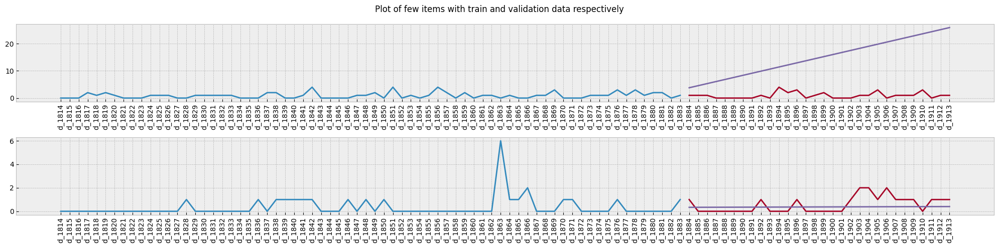

In [121]:
ids = [0, 2]
pred, error_holt= holt_smoothing()
rmse_holt = np.sqrt(mean_squared_error(val_dataset[:3].values.flatten(), pred.flatten()))
rmse.append(rmse_holt)
print(f"Holt Forecast RMSE: {rmse_holt:.4f}")
plot_graphs(ids, pred, True)

4. Exponential smoothing or holt-Winter smoothing - This take both trend and seasonality into consideration

In [78]:
def winter_smoothing():
    predictions = []
    for row in tqdm(train_dataset[train_dataset.columns[-30:]].values[:3]):
        fit = ExponentialSmoothing(row, seasonal_periods=3).fit()
        predictions.append(fit.forecast(30))
    predictions = np.array(predictions).reshape(-1, 30) # Reshaping to make sure it has 30 columns
    error_norm = np.linalg.norm(predictions[:3] - val_dataset[:3]/len(predictions[0]))
    return predictions, float(error_norm)

100%|████████████████████████████████████████████| 3/3 [00:00<00:00, 154.11it/s]


Winter Forecast RMSE: 0.7686


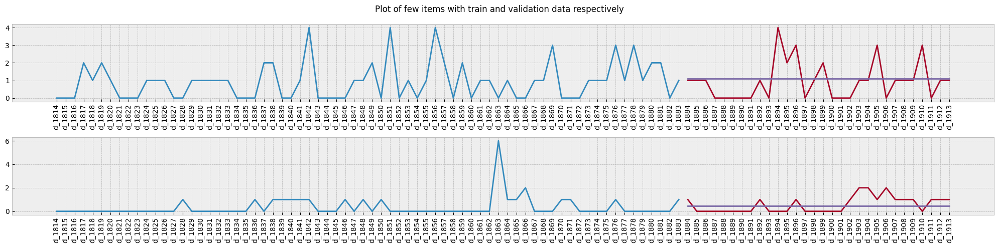

In [122]:
ids = [0, 2]
pred, error_winter = winter_smoothing()
rmse_ws = np.sqrt(mean_squared_error(val_dataset[:3].values.flatten(), pred.flatten()))
rmse.append(rmse_ws)
print(f"Winter Forecast RMSE: {rmse_ws:.4f}")
plot_graphs(ids, pred, True)

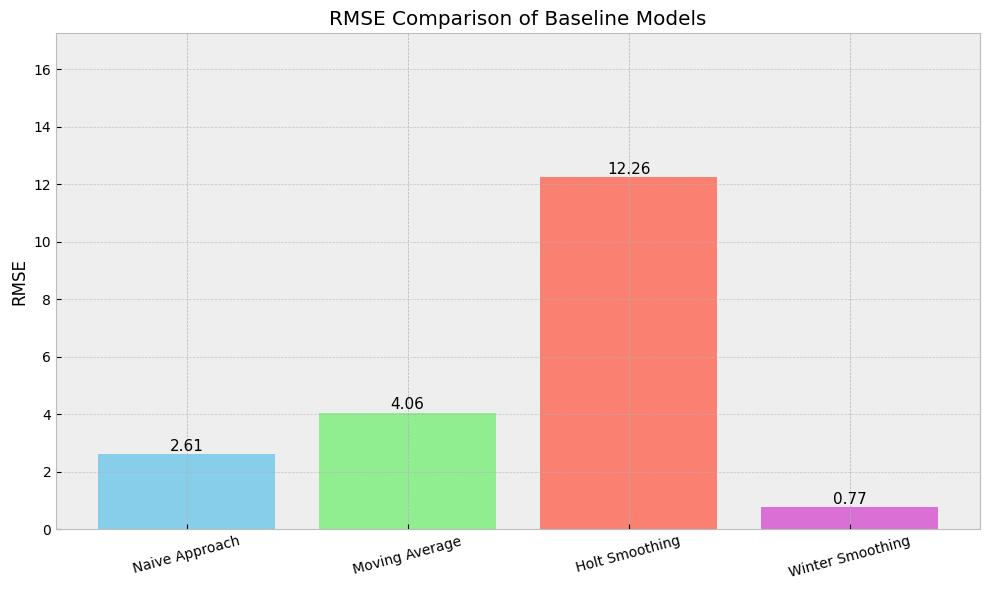

In [124]:
# Model names in the specified order
models = [
    "Naive Approach",
    "Moving Average",
    "Holt Smoothing",
    "Winter Smoothing"
]

# Plot
plt.figure(figsize=(10, 6))
bars = plt.bar(models, rmse, color=['skyblue', 'lightgreen', 'salmon', 'orchid'])

# Add value labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}', ha='center', va='bottom', fontsize=11)

plt.title("RMSE Comparison of Baseline Models")
plt.ylabel("RMSE")
plt.ylim(0, max(rmse) + 5)
plt.xticks(rotation=15)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()